In [1]:
import numpy as np                       
import pandas as pd                      
import matplotlib.pyplot as plt          
import seaborn as sns                   

In [2]:
data = pd.read_csv('Meteorite_Landings.csv')

In [3]:
## Drop useless data

In [4]:
data = data.drop('GeoLocation', axis = 1)

In [5]:
data = data.drop(['name', 'id'], axis = 1)

In [6]:
## Binary and Label Encoding

In [7]:
data['recclass'] = data['recclass'].astype('category')
data['recclass'] = data['recclass'].cat.codes

In [8]:
data.fall.unique()

array(['Fell', 'Found'], dtype=object)

In [9]:
name = {'Valid': 0, 'Relict': 1}
data.nametype = [name[item] for item in data.nametype]

In [10]:
falle = {'Fell': 0, 'Found': 1}
data.fall = [falle[item] for item in data.fall]

In [11]:
pd.Timestamp.max

Timestamp('2262-04-11 23:47:16.854775807')

In [12]:
pd.Timestamp.min

Timestamp('1677-09-21 00:12:43.145225')

In [13]:
data['year'] = pd.to_datetime(data['year'], errors = 'coerce')
data['year'] = data['year'].dt.year

In [14]:
data.columns

Index(['nametype', 'recclass', 'mass (g)', 'fall', 'year', 'reclat',
       'reclong'],
      dtype='object')

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 7 columns):
nametype    45716 non-null int64
recclass    45716 non-null int16
mass (g)    45585 non-null float64
fall        45716 non-null int64
year        45404 non-null float64
reclat      38401 non-null float64
reclong     38401 non-null float64
dtypes: float64(4), int16(1), int64(2)
memory usage: 2.2 MB


In [16]:
#data.to_excel("data_clean.xlsx")

/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


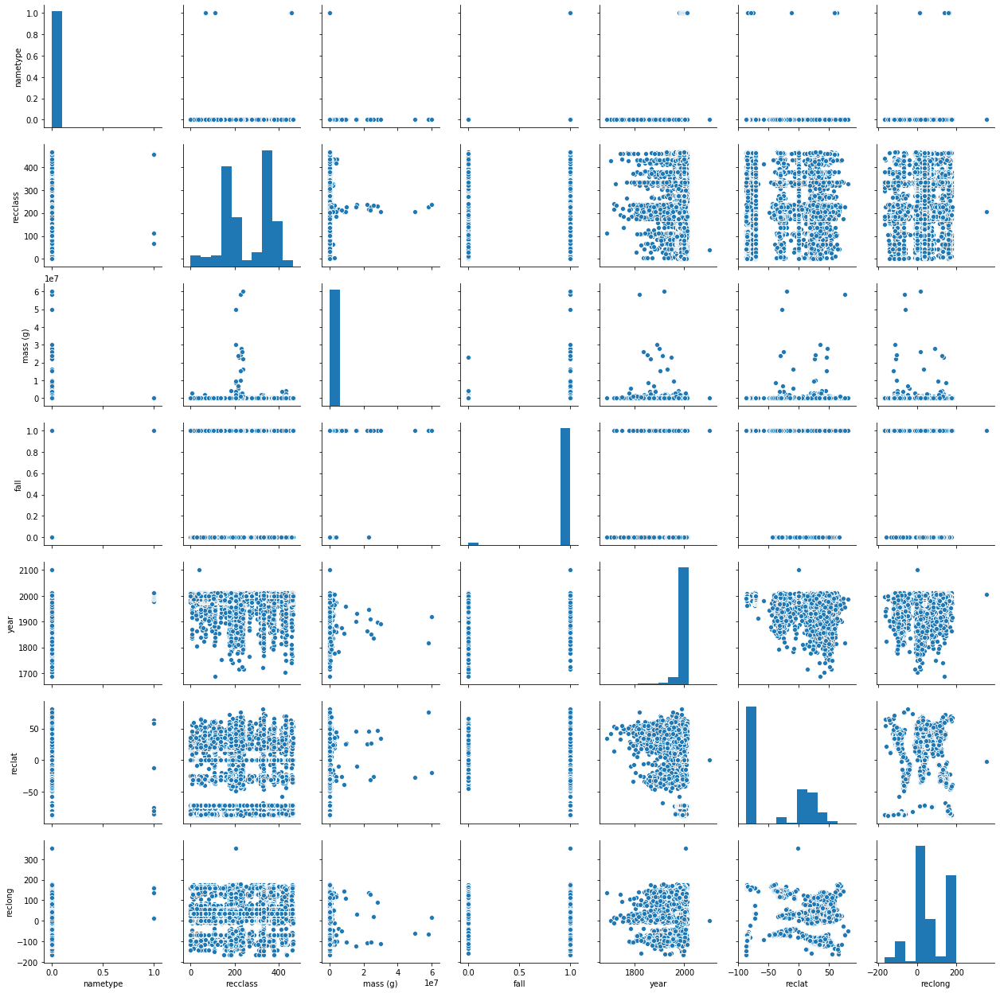

In [17]:
sns.pairplot(data)

In [44]:
data = data.dropna()

/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


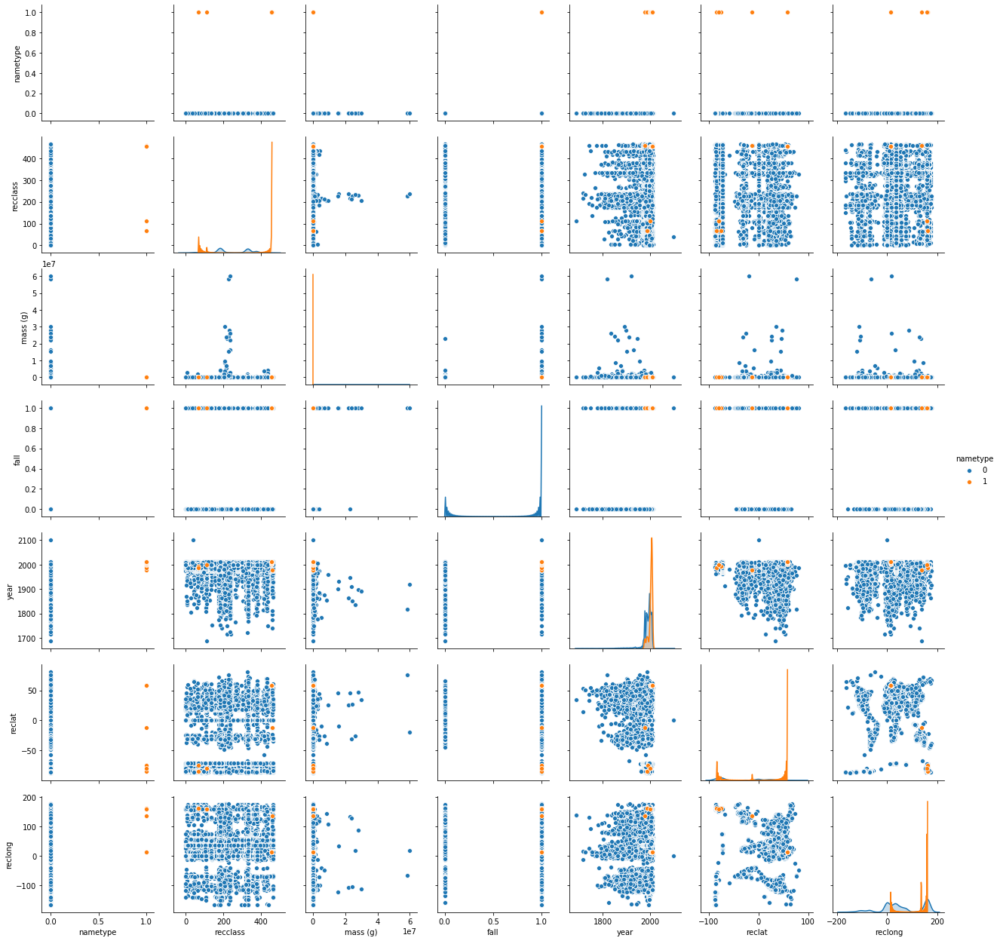

In [19]:
sns.pairplot(data, hue = 'nametype')

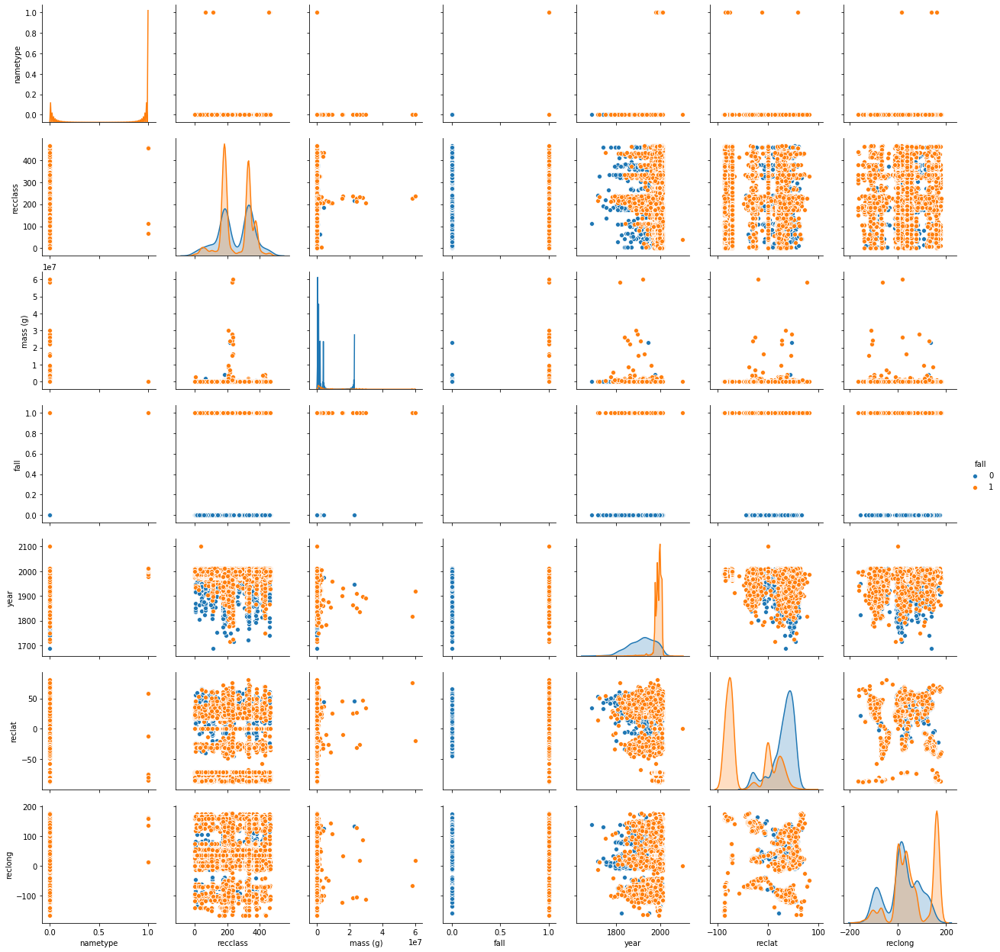

In [20]:
sns.pairplot(data, hue = 'fall')

In [17]:
data.columns

Index(['nametype', 'recclass', 'mass (g)', 'fall', 'year', 'reclat',
       'reclong'],
      dtype='object')

In [18]:
data.nametype.value_counts()

0    45641
1       75
Name: nametype, dtype: int64

In [19]:
data.fall.value_counts()

1    44609
0     1107
Name: fall, dtype: int64

In [20]:
#data.year.value_counts()

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

In [22]:
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import NearestNeighbors
from lightgbm import LGBMRegressor
#from catboost import CatBoostRegressor
#from xgboost import XGBRegressor

/Users/aleksandrberezutskii/opt/anaconda3/lib/python3.7/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [23]:
from sklearn.metrics import r2_score
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [24]:
import tqdm 
from tqdm import tqdm_notebook

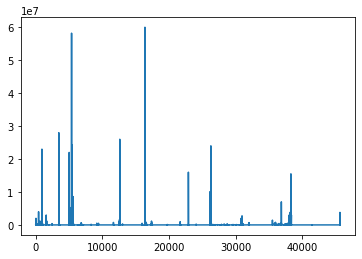

In [26]:
plt.plot(data['mass (g)'])

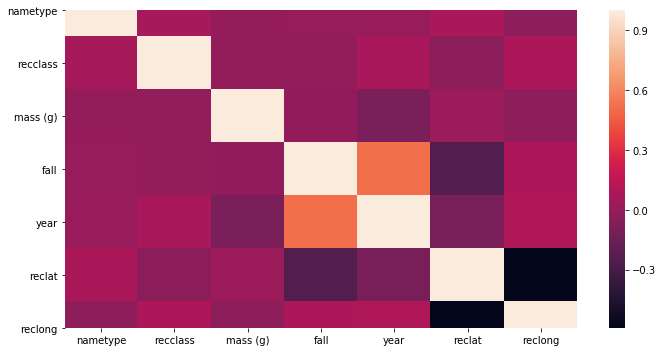

In [27]:
corr = data.corr()

fig, ax = plt.subplots(figsize=(10, 5))  
sns.heatmap(corr);


plt.tight_layout()

In [28]:
data.columns

Index(['nametype', 'recclass', 'mass (g)', 'fall', 'year', 'reclat',
       'reclong'],
      dtype='object')

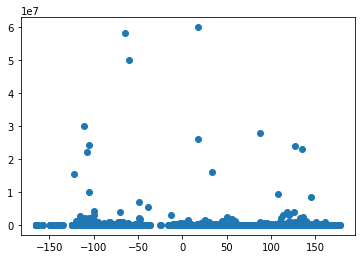

In [29]:
plt.plot(data['reclong'], data['mass (g)'], 'o')

In [30]:
data['mass (g)'] = data['mass (g)'][data['mass (g)'] < 1e7]

In [31]:
data['mass (g)'] = data['mass (g)'][data['mass (g)'] < 10000]
data = data.dropna()

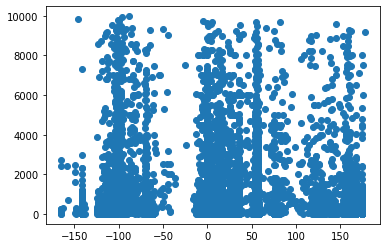

In [32]:
plt.plot(data['reclong'], data['mass (g)'], 'o')

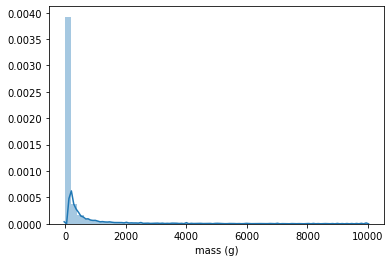

In [33]:
sns.distplot(data['mass (g)'])

In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 36826 entries, 0 to 45715
Data columns (total 7 columns):
nametype    36826 non-null int64
recclass    36826 non-null int16
mass (g)    36826 non-null float64
fall        36826 non-null int64
year        36826 non-null float64
reclat      36826 non-null float64
reclong     36826 non-null float64
dtypes: float64(4), int16(1), int64(2)
memory usage: 2.0 MB


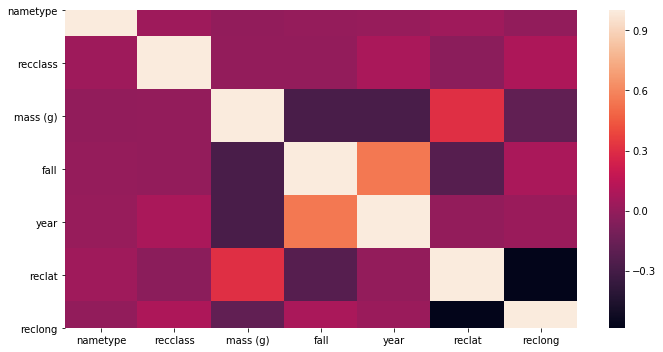

In [35]:
corr = data.corr()

fig, ax = plt.subplots(figsize=(10, 5))  
sns.heatmap(corr);

plt.tight_layout()

In [36]:
y = data['mass (g)']
X = data.drop('mass (g)', axis = 1)

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=420)

In [86]:
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import NearestNeighbors
from lightgbm import LGBMRegressor
#from catboost import CatBoostRegressor
#from catboost._catboost import CatBoostRegressor
#from xgboost import XGBRegressor
#import catboost

In [87]:
regs = [
    DecisionTreeRegressor(random_state=420),
    RandomForestRegressor(n_jobs=-1, random_state=420),
    SVR(kernel='rbf'),
    KNeighborsRegressor(n_jobs=-1),
    ExtraTreeRegressor(random_state=420),
    #CatBoostRegressor(random_state=420, silent=True),
    #LGBMRegressor(n_jobs=-1, random_state=420),
    #xgb.XGBRegressor(n_jobs=-1, random_state=420)
]

In [88]:
res = pd.DataFrame(index=['CV', 'Test'])

for reg in tqdm_notebook(regs):
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_test)
    test_score = r2_score(y_pred, y_test)
    
    scores = cross_val_score(reg, X_train, y_train, cv=3, n_jobs=-1)
    
    res[reg.__class__.__name__] = scores.mean(), test_score
res

,DecisionTreeRegressor,RandomForestRegressor,SVR,KNeighborsRegressor,ExtraTreeRegressor
CV,-0.294703,0.177745,-0.074054,0.146203,-0.257267
Test,-0.390767,-0.742621,-1770.000108,-1.010086,-0.286222


In [81]:
# машинное обучение
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from lightgbm import LGBMClassifier
#from catboost import CatBoostClassifier
from xgboost import XGBClassifier

from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import NearestNeighbors
from lightgbm import LGBMRegressor
#from catboost import CatBoostRegressor
from xgboost import XGBRegressor

from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, ClassifierMixin, clone
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier



Using TensorFlow backend.


In [91]:
data.columns

Index(['nametype', 'recclass', 'mass (g)', 'fall', 'year', 'reclat',
       'reclong'],
      dtype='object')

In [89]:
# Balance
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

Using TensorFlow backend.


In [90]:
from imblearn.over_sampling import RandomOverSampler
sm = RandomOverSampler()

In [92]:
y = data['nametype']
X = data.drop('nametype', axis = 1)

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=420)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [111]:
clfs = [
    DecisionTreeClassifier(random_state=420),
    RandomForestClassifier(n_jobs=-1, random_state=420),
    LogisticRegression(n_jobs=-1, random_state=420),
    SVC(kernel='rbf', random_state=420),
    GaussianNB(),
    KNeighborsClassifier(n_jobs=-1),
    ExtraTreeClassifier(random_state=420),
    #CatBoostClassifier(random_state=420, silent=True),
    LGBMClassifier(n_jobs=-1, random_state=420),
    #XGBClassifier(n_jobs=-1, random_state=420)
]

In [112]:
#from sklearn.externals.joblib.externals.loky.backend import synchronize
from sklearn.model_selection import cross_val_score
from tqdm import tqdm, tqdm_notebook

In [117]:
res = pd.DataFrame(index=['CV', 'Test'])

for clf in tqdm_notebook(clfs):
    clf.fit(X_res, y_res)
    y_pred = clf.predict(X_test)
    test_score = f1_score(y_pred, y_test, average='weighted')
    scores = cross_val_score(clf, X_res, y_res, cv=3)
    res[reg.__class__.__name__] = scores.mean(), test_score
res

/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1232: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1232: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1232: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1232: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is 

,ExtraTreeRegressor
CV,0.999982
Test,0.999896


In [ ]:
# Delete unpopilar classes

In [62]:
data

,nametype,recclass,mass (g),fall,year,reclat,reclong
0,0,327,21.0,0,1880.0,50.77500,6.08333
1,0,191,720.0,0,1951.0,56.18333,10.23333
3,0,0,1914.0,0,1976.0,16.88333,-99.90000
4,0,333,780.0,0,1902.0,-33.16667,-64.95000
5,0,84,4239.0,0,1919.0,32.10000,71.80000
...,...,...,...,...,...,...,...
45711,0,103,172.0,1,1990.0,29.03700,17.01850
45712,0,435,46.0,1,1999.0,13.78333,8.96667
45713,0,175,3.3,1,1939.0,49.25000,17.66667
45714,0,333,2167.0,1,2003.0,49.78917,41.50460


In [75]:
value_counts = data.recclass.value_counts()
to_remove = value_counts[value_counts <= 50].index
data = data[~data.recclass.isin(to_remove)]

In [76]:
data

,nametype,recclass,mass (g),fall,year,reclat,reclong
0,0,327,21.0,0,1880.0,50.77500,6.08333
1,0,191,720.0,0,1951.0,56.18333,10.23333
4,0,333,780.0,0,1902.0,-33.16667,-64.95000
8,0,333,1620.0,0,1930.0,-31.60000,-65.23333
13,0,333,779.0,0,1949.0,29.51667,35.05000
...,...,...,...,...,...,...,...
45704,0,378,76.0,1,1973.0,20.25000,-12.68333
45710,0,333,1475.0,1,1990.0,29.03700,17.01850
45711,0,103,172.0,1,1990.0,29.03700,17.01850
45713,0,175,3.3,1,1939.0,49.25000,17.66667


In [77]:
y = data['recclass']
X = data.drop('recclass', axis = 1)

In [78]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=420)

In [87]:
clfs = [
    DecisionTreeClassifier(random_state=420),
    #RandomForestClassifier(n_jobs=-1, random_state=420),
    LogisticRegression(n_jobs=-1, random_state=420),
    SVC(kernel='rbf', random_state=420),
    GaussianNB(),
    KNeighborsClassifier(n_jobs=-1),
    ExtraTreeClassifier(random_state=420),
    #CatBoostClassifier(random_state=420, silent=True),
    LGBMClassifier(n_jobs=-1, random_state=420),
    #XGBClassifier(n_jobs=-1, random_state=420)
]

In [ ]:
res = pd.DataFrame(index=['CV', 'Test'])

for clf in tqdm_notebook(clfs):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    test_score = f1_score(y_pred, y_test, average='weighted')
    
    scores = cross_val_score(clf, X_train, y_train, cv=3, n_jobs=-1)
    
    res[clf.__class__.__name__] = scores.mean(), test_score
res

/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:1232: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = -1.
  " = {}.".format(self.n_jobs))
/anaconda3/lib/python3.7/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [38]:
import os 
import folium
from folium import plugins
import rasterio as rio
from rasterio.warp import calculate_default_transform, reproject, Resampling
import earthpy as et

# Import data from EarthPy
os.chdir(os.path.join(et.io.HOME, 'earth-analytics'))

In [39]:
data = data.dropna()

In [40]:
locations = data[['reclat', 'reclong']]
locationlist = locations.values.tolist()

In [41]:
map = folium.Map()
for point in range(0, len(locationlist)):
    folium.Marker(locationlist[point]).add_to(map)
map